In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np 
import pandas as pd 
import warnings
warnings.filterwarnings('ignore')
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import plotly.graph_objs as go
import plotly.express as px
import joblib
from tqdm import tqdm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense,Dropout,GRU,RNN,Conv1D,SimpleRNN, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import optimizers, metrics, losses
from tensorflow.keras.callbacks import EarlyStopping




In [2]:
data = pd.read_csv('/kaggle/input/696969/3.csv')

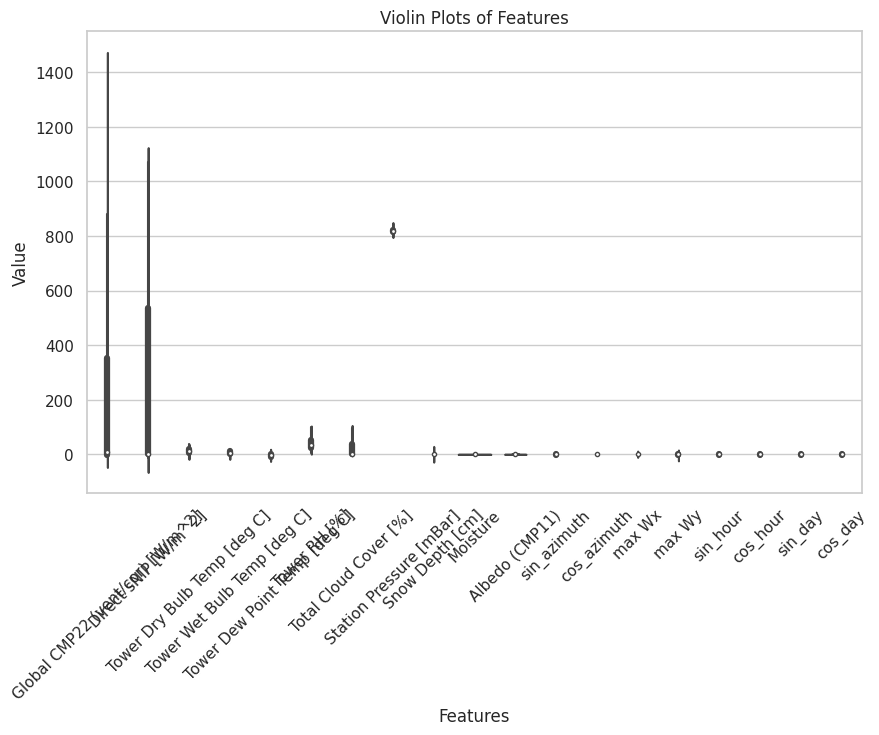

In [3]:
# Set the style of the visualization
sns.set(style="whitegrid")

# Create a violin plot for each feature in the dataset
plt.figure(figsize=(10, 6))  # Set the figure size
sns.violinplot(data=data)  # You can specify particular columns with data=data[['col1', 'col2']]

# Adding titles and labels
plt.title('Violin Plots of Features')
plt.ylabel('Value')
plt.xlabel('Features')

# Improve layout
plt.xticks(rotation=45)  # Rotate x labels for better readability if needed

plt.show()

In [3]:
scaler = MinMaxScaler()
# Get the index of the label column
label_column = "Total Cloud Cover [%]"
label_column_index = data.columns.get_loc(label_column)

# Determine the split point (e.g., 80% training, 20% testing)
split_point = int(len(data) * 0.9)

# Split the data into training and testing sets
train_data = data.iloc[:split_point]
test_data = data.iloc[split_point:]

train_data_scaled = scaler.fit_transform(train_data)
test_data_scaled = scaler.transform(test_data)

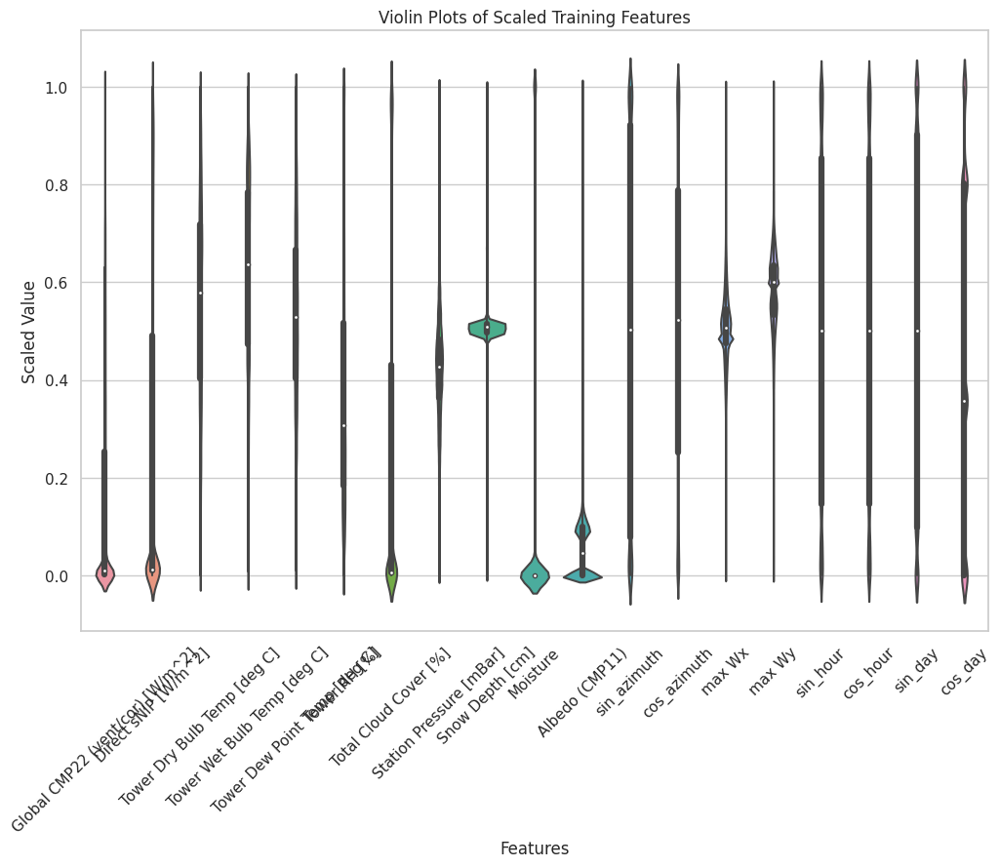

In [5]:
# Convert the scaled data back to DataFrame to plot violin plots
train_data_scaled_df = pd.DataFrame(train_data_scaled, columns=train_data.columns)
test_data_scaled_df = pd.DataFrame(test_data_scaled, columns=test_data.columns)

# Plot violin plots for scaled training data
plt.figure(figsize=(12, 8))
sns.violinplot(data=train_data_scaled_df)
plt.title('Violin Plots of Scaled Training Features')
plt.ylabel('Scaled Value')
plt.xlabel('Features')
plt.xticks(rotation=45)
plt.show()

In [4]:
# Convert the DataFrames to NumPy arrays
train_data_scaled = np.asarray(train_data_scaled).astype(np.float32)
test_data_scaled = np.asarray(test_data_scaled).astype(np.float32)

class TimeSeriesGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, data, look_back=75, step_ahead=30, batch_size=32, shuffle=True, target_column_index=-1):
        'Initialization'
        self.data = data
        self.look_back = look_back
        self.step_ahead = step_ahead
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.target_column_index = target_column_index
        self.indices = np.arange(len(data) - look_back - step_ahead + 1)
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.indices) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        # Generate data
        X, y = self.__data_generation(batch_indices)
        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __data_generation(self, batch_indices):
        'Generates data containing batch_size samples'
        X = np.empty((self.batch_size, self.look_back, self.data.shape[1]))
        y = np.empty((self.batch_size,))
        
        for i, idx in enumerate(batch_indices):
            X[i,] = self.data[idx:idx + self.look_back]
            y[i,] = self.data[idx + self.look_back + self.step_ahead - 1, self.target_column_index]
                

        return X, y

In [5]:
def weighted_rmse(weights_zero, weights_nonzero):
    def loss(y_true, y_pred):
        # Create a mask for zero and non-zero values
        is_zero = tf.cast(tf.equal(y_true, 0), tf.float32)
        is_nonzero = 1 - is_zero
        # Calculate squared error
        sq_error = tf.square(y_true - y_pred)
        
        # Apply different weights to zero and non-zero errors
        weighted_sq_error = (is_zero * weights_zero + is_nonzero * weights_nonzero) * sq_error
        
        # Calculate mean of weighted squared error and then take the square root
        mean_weighted_sq_error = tf.reduce_mean(weighted_sq_error)
        rmse = tf.sqrt(mean_weighted_sq_error)
        return rmse
    
    return loss

In [6]:
# Define configurations
lstm_layer_configs =  [[100]]
dense_layer_configs =  [[32,64]]
configurations = [(lstm, dense) for lstm in lstm_layer_configs for dense in dense_layer_configs]

In [7]:
def build_model_lstm(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape):
    model = Sequential()
    for i in range(num_lstm_layers):
        if i == 0:
            # First LSTM layer with input shape
            model.add(LSTM(lstm_units[i], return_sequences=(i < num_lstm_layers - 1), input_shape=input_shape))
            model.add(Dropout(0.2))
        else:
            model.add(LSTM(lstm_units[i], return_sequences=(i < num_lstm_layers - 1)))


    for i in range(num_dense_layers):
        model.add(Dense(dense_units[i], activation='relu'))


    model.add(Dense(1))
    
    model.compile(optimizer=Adam(), loss=weighted_rmse(weights_zero=0.2, weights_nonzero=0.8), metrics=[metrics.RootMeanSquaredError(), 'mae'])
    return model

 

In [8]:
def build_model_rnn(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape):
    model = Sequential()
    for i in range(num_lstm_layers):
        if i == 0:
            # First LSTM layer with input shape
            model.add(SimpleRNN(lstm_units[i], return_sequences=(i < num_lstm_layers - 1), input_shape=input_shape))
            model.add(Dropout(0.2))
        else:
            model.add(SimpleRNN(lstm_units[i], return_sequences=(i < num_lstm_layers - 1)))

    for i in range(num_dense_layers):
        model.add(Dense(dense_units[i], activation='relu'))
  
    model.add(Dense(1))
    
    model.compile(optimizer=Adam(), loss=weighted_rmse(weights_zero=0.2, weights_nonzero=0.8), metrics=[metrics.RootMeanSquaredError(), 'mae'])
    return model

In [9]:
def build_model_gru(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape):
    model = Sequential()
    for i in range(num_lstm_layers):
        if i == 0:
            # First LSTM layer with input shape
            model.add(GRU(lstm_units[i], return_sequences=(i < num_lstm_layers - 1), input_shape=input_shape))
            model.add(Dropout(0.2))
        else:
            model.add(GRU(lstm_units[i], return_sequences=(i < num_lstm_layers - 1)))

    for i in range(num_dense_layers):
        model.add(Dense(dense_units[i], activation='relu'))
  
    model.add(Dense(1))
    
    model.compile(optimizer=Adam(), loss=weighted_rmse(weights_zero=0.2, weights_nonzero=0.8), metrics=[metrics.RootMeanSquaredError(), 'mae'])
    return model

In [10]:
def build_model_bilstm(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape):
    model = Sequential()
    for i in range(num_lstm_layers):
        if i == 0:
            # First LSTM layer with input shape
            model.add(Bidirectional(LSTM(lstm_units[i], return_sequences=(i < num_lstm_layers - 1), input_shape=input_shape)))
            model.add(Dropout(0.2))
        else:
            model.add(Bidirectional(LSTM(lstm_units[i], return_sequences=(i < num_lstm_layers - 1))))

    for i in range(num_dense_layers):
        model.add(Dense(dense_units[i], activation='relu'))
  
    model.add(Dense(1))
    
    model.compile(optimizer=Adam(), loss=weighted_rmse(weights_zero=0.2, weights_nonzero=0.8), metrics=[metrics.RootMeanSquaredError(), 'mae'])
    return model

In [11]:
def build_model_convlstm(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape):
    model = Sequential()
    # Add Conv1D layer
    model.add(Conv1D(filters=32, kernel_size=5, activation='relu', input_shape=input_shape))
    
    for i in range(num_lstm_layers):
        if i == 0:
            # First LSTM layer with input shape
            model.add(LSTM(lstm_units[i], return_sequences=(i < num_lstm_layers - 1)))
            model.add(Dropout(0.2))
        else:
            model.add(LSTM(lstm_units[i], return_sequences=(i < num_lstm_layers - 1)))

    for i in range(num_dense_layers):
        model.add(Dense(dense_units[i], activation='relu'))
  
    model.add(Dense(1))
    
    model.compile(optimizer=Adam(), loss=weighted_rmse(weights_zero=0.2, weights_nonzero=0.8), metrics=[metrics.RootMeanSquaredError(), 'mae'])
    return model

In [12]:
def run_model(model_type, lstm_units, dense_units, input_shape, train_gen, test_gen, horizon):
    num_lstm_layers = len(lstm_units)
    num_dense_layers = len(dense_units)
    print(f"Building model with {num_lstm_layers} {model_type.upper()} layers and {num_dense_layers} Dense layers for {horizon}-minute horizon")
    
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    
    if model_type == 'lstm':
        model = build_model_lstm(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape)
    elif model_type == 'rnn':
        model = build_model_rnn(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape)
    elif model_type == 'gru':
        model = build_model_gru(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape)
    elif model_type == 'bilstm':
        model = build_model_bilstm(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape)
    elif model_type == 'convlstm':
        model = build_model_convlstm(num_lstm_layers, lstm_units, num_dense_layers, dense_units, input_shape)
    
    print(model.summary())

    # Train the model
    history = model.fit(train_gen, epochs=10, validation_data=test_gen, callbacks=[early_stopping])

    # Evaluate the model on the scaled test data
    test_loss, test_rmse, test_mae = model.evaluate(test_gen)
    print(f'Test Loss (scaled): {test_loss}, Test RMSE (scaled): {test_rmse}, Test MAE (scaled): {test_mae}')

    # Make predictions on the test data with a progress bar
    predictions = []
    true_labels = []
    for i in tqdm(range(len(test_gen)), desc='Predicting', unit='batch'):
        x_test, y_test = test_gen[i]
        pred = model.predict(x_test, verbose=0)
        predictions.append(pred)
        true_labels.append(y_test)
    
    testPredict = np.concatenate(predictions).reshape(-1, 1)
    testY = np.concatenate(true_labels).reshape(-1, 1)

    # Repeat predictions to match the shape of the original data
    testPredict_repeated = np.repeat(testPredict, 19, axis=-1)
    testY_repeated = np.repeat(testY, 19, axis=-1)

    # Inverse transform the repeated arrays
    testPredict_original = scaler.inverse_transform(testPredict_repeated)[:, label_column_index]
    testY_original = scaler.inverse_transform(testY_repeated)[:, label_column_index]

    # Calculate evaluation metrics on the original scale
    test_rmse_original = math.sqrt(mean_squared_error(testY_original, testPredict_original))
    test_mae_original = mean_absolute_error(testY_original, testPredict_original)
    test_r2_original = r2_score(testY_original, testPredict_original)
    
    print(f'Test RMSE (original scale): {test_rmse_original}')
    print(f'Test MAE (original scale): {test_mae_original}')
    print(f'Test R² (original scale): {test_r2_original}')

    return history, test_loss, test_rmse_original, test_mae_original, test_r2_original, testY_original, testPredict_original


In [15]:
forecast_horizons = [30, 25, 15] 
models = {}
weights = {15: 0.5, 25: 0.35, 30: 0.15}
model_type = 'lstm'

all_predictions = {}
all_true_values = {}

for horizon in forecast_horizons:
    print(f"Training model for {horizon}-minute ahead prediction:")
    # Create generators for each horizon
    train_gen = TimeSeriesGenerator(train_data_scaled, step_ahead=horizon, batch_size=32, shuffle=True, target_column_index=6)
    test_gen = TimeSeriesGenerator(test_data_scaled, step_ahead=horizon, batch_size=32, shuffle=False, target_column_index=6)
    input_shape = (train_gen.look_back, train_data_scaled.shape[1])
    
    config_index = 0  # Adjust this index to run different configurations
    lstm_units, dense_units = configurations[config_index]
    
    history, test_loss, test_rmse, test_mae, test_r2_original, testY_original, testPredict_original = run_model(model_type, lstm_units, dense_units, input_shape, train_gen, test_gen, horizon)
    models[horizon] = (history, test_loss, test_rmse, test_mae, test_r2_original)
    
    all_true_values[horizon] = testY_original
    all_predictions[horizon] = testPredict_original

weighted_sum = sum(weights[horizon] * models[horizon][4] for horizon in forecast_horizons)
print(f"Weighted Sum of R² Scores: {weighted_sum}")

# Plotting all horizons on a single graph
fig = go.Figure()

for horizon in forecast_horizons:
    fig.add_trace(go.Scatter(x=list(range(len(all_true_values[horizon]))), y=all_true_values[horizon], mode='lines', name=f'True Values {horizon}-min'))
    fig.add_trace(go.Scatter(x=list(range(len(all_predictions[horizon]))), y=all_predictions[horizon], mode='lines', name=f'Predicted Values {horizon}-min'))

fig.update_layout(title='True vs Predicted Values for All Horizons', xaxis_title='Index', yaxis_title='Value', template='plotly_dark')

# Save the interactive plot as an HTML file
filename = "forecast_all_horizons_lstm.html"
fig.write_html(filename)
print(f"Interactive plot saved as {filename}")

fig.show()


Training model for 30-minute ahead prediction:
Building model with 1 LSTM layers and 2 Dense layers for 30-minute horizon


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 100)            │        48,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,409 (208.63 KB)

 Trainable params: 53,409 (208.63 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 95s 7ms/step - loss: 0.1074 - mae: 0.0665 - root_mean_squared_error: 0.1269 - val_loss: 0.0378 - val_mae: 0.0367 - val_root_mean_squared_error: 0.0900
Epoch 2/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0926 - mae: 0.0539 - root_mean_squared_error: 0.1091 - val_loss: 0.0358 - val_mae: 0.0347 - val_root_mean_squared_error: 0.0878
Epoch 3/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0892 - mae: 0.0511 - root_mean_squared_error: 0.1051 - val_loss: 0.0368 - val_mae: 0.0358 - val_root_mean_squared_error: 0.0899
Epoch 4/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 92s 7ms/step - loss: 0.0874 - mae: 0.0498 - root_mean_squared_error: 0.1031 - val_loss: 0.0391 - val_mae: 0.0381 - val_root_mean_squared_error: 0.0921
Epoch 5/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 92s 7ms/step - loss: 0.0844 - mae: 0.0478 - root_mean_squared_error: 0.0996 - val_loss: 0.0402 - val_mae: 0.0393 - val_root_mean_squared_error: 0.0963
Epoch 6/20
13564/135

Predicting: 100%|██████████| 1504/1504 [01:22<00:00, 18.19batch/s]


Test RMSE (original scale): 8.88423294241839
Test MAE (original scale): 3.5112850432085287
Test R² (original scale): 0.8750236456400258
Training model for 25-minute ahead prediction:
Building model with 1 LSTM layers and 2 Dense layers for 25-minute horizon


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                   │ (None, 100)            │        48,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,409 (208.63 KB)

 Trainable params: 53,409 (208.63 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 92s 7ms/step - loss: 0.0989 - mae: 0.0606 - root_mean_squared_error: 0.1174 - val_loss: 0.0380 - val_mae: 0.0370 - val_root_mean_squared_error: 0.0864
Epoch 2/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 89s 7ms/step - loss: 0.0848 - mae: 0.0484 - root_mean_squared_error: 0.1001 - val_loss: 0.0356 - val_mae: 0.0341 - val_root_mean_squared_error: 0.0825
Epoch 3/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 90s 7ms/step - loss: 0.0827 - mae: 0.0468 - root_mean_squared_error: 0.0976 - val_loss: 0.0328 - val_mae: 0.0313 - val_root_mean_squared_error: 0.0801
Epoch 4/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0808 - mae: 0.0456 - root_mean_squared_error: 0.0956 - val_loss: 0.0369 - val_mae: 0.0360 - val_root_mean_squared_error: 0.0807
Epoch 5/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0792 - mae: 0.0444 - root_mean_squared_error: 0.0936 - val_loss: 0.0349 - val_mae: 0.0331 - val_root_mean_squared_error: 0.0834
Epoch 6/20
13564/135

Predicting: 100%|██████████| 1504/1504 [01:23<00:00, 17.94batch/s]


Test RMSE (original scale): 8.104966113529017
Test MAE (original scale): 3.1677856615520206
Test R² (original scale): 0.8959834618900702
Training model for 15-minute ahead prediction:
Building model with 1 LSTM layers and 2 Dense layers for 15-minute horizon


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 100)            │        48,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,409 (208.63 KB)

 Trainable params: 53,409 (208.63 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0785 - mae: 0.0484 - root_mean_squared_error: 0.0943 - val_loss: 0.0277 - val_mae: 0.0256 - val_root_mean_squared_error: 0.0648
Epoch 2/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 90s 7ms/step - loss: 0.0659 - mae: 0.0375 - root_mean_squared_error: 0.0788 - val_loss: 0.0277 - val_mae: 0.0260 - val_root_mean_squared_error: 0.0625
Epoch 3/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0637 - mae: 0.0359 - root_mean_squared_error: 0.0761 - val_loss: 0.0272 - val_mae: 0.0255 - val_root_mean_squared_error: 0.0613
Epoch 4/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0622 - mae: 0.0346 - root_mean_squared_error: 0.0742 - val_loss: 0.0271 - val_mae: 0.0254 - val_root_mean_squared_error: 0.0609
Epoch 5/20
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 91s 7ms/step - loss: 0.0620 - mae: 0.0344 - root_mean_squared_error: 0.0739 - val_loss: 0.0269 - val_mae: 0.0252 - val_root_mean_squared_error: 0.0608
Epoch 6/20
13564/135

Predicting: 100%|██████████| 1504/1504 [01:24<00:00, 17.84batch/s]


Test RMSE (original scale): 6.338267331463199
Test MAE (original scale): 2.4755688247893777
Test R² (original scale): 0.9363843043416152
Weighted Sum of R² Scores: 0.913039910678336
Interactive plot saved as forecast_all_horizons_lstm.html


In [13]:
forecast_horizons = [30, 25, 15] 
models = {}
weights = {15: 0.5, 25: 0.35, 30: 0.15}
model_type = 'rnn'

all_predictions = {}
all_true_values = {}

for horizon in forecast_horizons:
    print(f"Training model for {horizon}-minute ahead prediction:")
    # Create generators for each horizon
    train_gen = TimeSeriesGenerator(train_data_scaled, step_ahead=horizon, batch_size=32, shuffle=True, target_column_index=6)
    test_gen = TimeSeriesGenerator(test_data_scaled, step_ahead=horizon, batch_size=32, shuffle=False, target_column_index=6)
    input_shape = (train_gen.look_back, train_data_scaled.shape[1])
    
    config_index = 0  # Adjust this index to run different configurations
    lstm_units, dense_units = configurations[config_index]
    
    history, test_loss, test_rmse, test_mae, test_r2_original, testY_original, testPredict_original = run_model(model_type, lstm_units, dense_units, input_shape, train_gen, test_gen, horizon)
    models[horizon] = (history, test_loss, test_rmse, test_mae, test_r2_original)
    
    all_true_values[horizon] = testY_original
    all_predictions[horizon] = testPredict_original

weighted_sum = sum(weights[horizon] * models[horizon][4] for horizon in forecast_horizons)
print(f"Weighted Sum of R² Scores: {weighted_sum}")

# Plotting all horizons on a single graph
fig = go.Figure()

for horizon in forecast_horizons:
    fig.add_trace(go.Scatter(x=list(range(len(all_true_values[horizon]))), y=all_true_values[horizon], mode='lines', name=f'True Values {horizon}-min'))
    fig.add_trace(go.Scatter(x=list(range(len(all_predictions[horizon]))), y=all_predictions[horizon], mode='lines', name=f'Predicted Values {horizon}-min'))

fig.update_layout(title='True vs Predicted Values for All Horizons', xaxis_title='Index', yaxis_title='Value', template='plotly_dark')

# Save the interactive plot as an HTML file
filename = "forecast_all_horizons_rnn.html"
fig.write_html(filename)
print(f"Interactive plot saved as {filename}")

fig.show()


Training model for 30-minute ahead prediction:
Building model with 1 RNN layers and 2 Dense layers for 30-minute horizon


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 100)            │        12,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,409 (68.00 KB)

 Trainable params: 17,409 (68.00 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/5
   16/13564 ━━━━━━━━━━━━━━━━━━━━ 2:37 12ms/step - loss: 0.3905 - mae: 0.3521 - root_mean_squared_error: 0.4674

I0000 00:00:1718995210.406921     112 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


13564/13564 ━━━━━━━━━━━━━━━━━━━━ 99s 7ms/step - loss: 0.1159 - mae: 0.0748 - root_mean_squared_error: 0.1370 - val_loss: 0.0565 - val_mae: 0.0573 - val_root_mean_squared_error: 0.1083
Epoch 2/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.1076 - mae: 0.0667 - root_mean_squared_error: 0.1263 - val_loss: 0.0498 - val_mae: 0.0501 - val_root_mean_squared_error: 0.1042
Epoch 3/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.1051 - mae: 0.0639 - root_mean_squared_error: 0.1234 - val_loss: 0.0450 - val_mae: 0.0452 - val_root_mean_squared_error: 0.1001
Epoch 4/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.1078 - mae: 0.0685 - root_mean_squared_error: 0.1269 - val_loss: 0.0398 - val_mae: 0.0387 - val_root_mean_squared_error: 0.0956
Epoch 5/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0994 - mae: 0.0600 - root_mean_squared_error: 0.1167 - val_loss: 0.0494 - val_mae: 0.0498 - val_root_mean_squared_error: 0.1009
1504/1504 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/st

Predicting: 100%|██████████| 1504/1504 [01:22<00:00, 18.32batch/s]


Test RMSE (original scale): 9.676552831692362
Test MAE (original scale): 3.920327136584563
Test R² (original scale): 0.8517381817771515
Training model for 25-minute ahead prediction:
Building model with 1 RNN layers and 2 Dense layers for 25-minute horizon


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_1 (SimpleRNN)        │ (None, 100)            │        12,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,409 (68.00 KB)

 Trainable params: 17,409 (68.00 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 97s 7ms/step - loss: 0.1056 - mae: 0.0674 - root_mean_squared_error: 0.1257 - val_loss: 0.0426 - val_mae: 0.0423 - val_root_mean_squared_error: 0.0927
Epoch 2/5
 3087/13564 ━━━━━━━━━━━━━━━━━━━━ 1:08 7ms/step - loss: 0.1000 - mae: 0.0627 - root_mean_squared_error: 0.1176

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



13564/13564 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - loss: 0.0949 - mae: 0.0571 - root_mean_squared_error: 0.1118 - val_loss: 0.0388 - val_mae: 0.0380 - val_root_mean_squared_error: 0.0871
Epoch 4/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - loss: 0.0930 - mae: 0.0553 - root_mean_squared_error: 0.1095 - val_loss: 0.0422 - val_mae: 0.0413 - val_root_mean_squared_error: 0.0868
Epoch 5/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0905 - mae: 0.0536 - root_mean_squared_error: 0.1067 - val_loss: 0.0401 - val_mae: 0.0391 - val_root_mean_squared_error: 0.0853
1504/1504 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0383 - mae: 0.0374 - root_mean_squared_error: 0.0802
Test Loss (scaled): 0.038818057626485825, Test RMSE (scaled): 0.08708380907773972, Test MAE (scaled): 0.03801839426159859


Predicting: 100%|██████████| 1504/1504 [01:24<00:00, 17.87batch/s]


Test RMSE (original scale): 8.811580544496127
Test MAE (original scale): 3.846891791587242
Test R² (original scale): 0.8770559206041404
Training model for 15-minute ahead prediction:
Building model with 1 RNN layers and 2 Dense layers for 15-minute horizon


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_2 (SimpleRNN)        │ (None, 100)            │        12,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,409 (68.00 KB)

 Trainable params: 17,409 (68.00 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 97s 7ms/step - loss: 0.0817 - mae: 0.0521 - root_mean_squared_error: 0.0979 - val_loss: 0.0285 - val_mae: 0.0265 - val_root_mean_squared_error: 0.0685
Epoch 2/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - loss: 0.0750 - mae: 0.0453 - root_mean_squared_error: 0.0893 - val_loss: 0.0324 - val_mae: 0.0307 - val_root_mean_squared_error: 0.0671
Epoch 3/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 95s 7ms/step - loss: 0.0704 - mae: 0.0409 - root_mean_squared_error: 0.0841 - val_loss: 0.0301 - val_mae: 0.0283 - val_root_mean_squared_error: 0.0662
Epoch 4/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - loss: 0.0681 - mae: 0.0392 - root_mean_squared_error: 0.0812 - val_loss: 0.0306 - val_mae: 0.0291 - val_root_mean_squared_error: 0.0676
Epoch 5/5
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - loss: 0.0698 - mae: 0.0407 - root_mean_squared_error: 0.0835 - val_loss: 0.0326 - val_mae: 0.0314 - val_root_mean_squared_error: 0.0717
1504/1504 ━━━━━━━━━━━━━━━

Predicting: 100%|██████████| 1504/1504 [01:21<00:00, 18.41batch/s]


Test RMSE (original scale): 6.9296503854885145
Test MAE (original scale): 2.678961609431632
Test R² (original scale): 0.9239593494515828
Weighted Sum of R² Scores: 0.8967099742038132
Interactive plot saved as forecast_all_horizons_rnn.html


In [13]:
forecast_horizons = [30, 25, 15] 
models = {}
weights = {15: 0.5, 25: 0.35, 30: 0.15}
model_type = 'gru'

all_predictions = {}
all_true_values = {}

for horizon in forecast_horizons:
    print(f"Training model for {horizon}-minute ahead prediction:")
    # Create generators for each horizon
    train_gen = TimeSeriesGenerator(train_data_scaled, step_ahead=horizon, batch_size=32, shuffle=True, target_column_index=6)
    test_gen = TimeSeriesGenerator(test_data_scaled, step_ahead=horizon, batch_size=32, shuffle=False, target_column_index=6)
    input_shape = (train_gen.look_back, train_data_scaled.shape[1])
    
    config_index = 0  # Adjust this index to run different configurations
    lstm_units, dense_units = configurations[config_index]
    
    history, test_loss, test_rmse, test_mae, test_r2_original, testY_original, testPredict_original = run_model(model_type, lstm_units, dense_units, input_shape, train_gen, test_gen, horizon)
    models[horizon] = (history, test_loss, test_rmse, test_mae, test_r2_original)
    
    all_true_values[horizon] = testY_original
    all_predictions[horizon] = testPredict_original

weighted_sum = sum(weights[horizon] * models[horizon][4] for horizon in forecast_horizons)
print(f"Weighted Sum of R² Scores: {weighted_sum}")

# Plotting all horizons on a single graph
fig = go.Figure()

for horizon in forecast_horizons:
    fig.add_trace(go.Scatter(x=list(range(len(all_true_values[horizon]))), y=all_true_values[horizon], mode='lines', name=f'True Values {horizon}-min'))
    fig.add_trace(go.Scatter(x=list(range(len(all_predictions[horizon]))), y=all_predictions[horizon], mode='lines', name=f'Predicted Values {horizon}-min'))

fig.update_layout(title='True vs Predicted Values for All Horizons', xaxis_title='Index', yaxis_title='Value', template='plotly_dark')

# Save the interactive plot as an HTML file
filename = "forecast_all_horizons_gru.html"
fig.write_html(filename)
print(f"Interactive plot saved as {filename}")

fig.show()



Training model for 30-minute ahead prediction:
Building model with 1 GRU layers and 2 Dense layers for 30-minute horizon


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 100)            │        36,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,709 (162.93 KB)

 Trainable params: 41,709 (162.93 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 99s 7ms/step - loss: 0.1066 - mae: 0.0664 - root_mean_squared_error: 0.1250 - val_loss: 0.0386 - val_mae: 0.0375 - val_root_mean_squared_error: 0.0912
Epoch 2/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 93s 7ms/step - loss: 0.0933 - mae: 0.0545 - root_mean_squared_error: 0.1098 - val_loss: 0.0398 - val_mae: 0.0387 - val_root_mean_squared_error: 0.0983
Epoch 3/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0901 - mae: 0.0518 - root_mean_squared_error: 0.1062 - val_loss: 0.0383 - val_mae: 0.0373 - val_root_mean_squared_error: 0.0912
Epoch 4/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0872 - mae: 0.0498 - root_mean_squared_error: 0.1028 - val_loss: 0.0389 - val_mae: 0.0377 - val_root_mean_squared_error: 0.0934
Epoch 5/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 95s 7ms/step - loss: 0.0842 - mae: 0.0481 - root_mean_squared_error: 0.0993 - val_loss: 0.0409 - val_mae: 0.0401 - val_root_mean_squared_error: 0.0934
Epoch 6/10
13564/135

Predicting: 100%|██████████| 1504/1504 [01:26<00:00, 17.31batch/s]


Test RMSE (original scale): 9.23300200157516
Test MAE (original scale): 3.7764732371209053
Test R² (original scale): 0.8650186283451486
Training model for 25-minute ahead prediction:
Building model with 1 GRU layers and 2 Dense layers for 25-minute horizon


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_1 (GRU)                     │ (None, 100)            │        36,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,709 (162.93 KB)

 Trainable params: 41,709 (162.93 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 95s 7ms/step - loss: 0.0989 - mae: 0.0621 - root_mean_squared_error: 0.1172 - val_loss: 0.0366 - val_mae: 0.0356 - val_root_mean_squared_error: 0.0856
Epoch 2/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0854 - mae: 0.0496 - root_mean_squared_error: 0.1008 - val_loss: 0.0340 - val_mae: 0.0326 - val_root_mean_squared_error: 0.0818
Epoch 3/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0819 - mae: 0.0467 - root_mean_squared_error: 0.0967 - val_loss: 0.0369 - val_mae: 0.0356 - val_root_mean_squared_error: 0.0827
Epoch 4/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0807 - mae: 0.0460 - root_mean_squared_error: 0.0954 - val_loss: 0.0356 - val_mae: 0.0340 - val_root_mean_squared_error: 0.0836
Epoch 5/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0780 - mae: 0.0442 - root_mean_squared_error: 0.0922 - val_loss: 0.0347 - val_mae: 0.0332 - val_root_mean_squared_error: 0.0827
Epoch 6/10
13564/135

Predicting: 100%|██████████| 1504/1504 [01:28<00:00, 17.07batch/s]


Test RMSE (original scale): 8.279908001967884
Test MAE (original scale): 3.300173564279058
Test R² (original scale): 0.8914447051387095
Training model for 15-minute ahead prediction:
Building model with 1 GRU layers and 2 Dense layers for 15-minute horizon


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_2 (GRU)                     │ (None, 100)            │        36,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,709 (162.93 KB)

 Trainable params: 41,709 (162.93 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 95s 7ms/step - loss: 0.0775 - mae: 0.0479 - root_mean_squared_error: 0.0937 - val_loss: 0.0303 - val_mae: 0.0289 - val_root_mean_squared_error: 0.0643
Epoch 2/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0655 - mae: 0.0370 - root_mean_squared_error: 0.0784 - val_loss: 0.0266 - val_mae: 0.0243 - val_root_mean_squared_error: 0.0614
Epoch 3/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0640 - mae: 0.0360 - root_mean_squared_error: 0.0763 - val_loss: 0.0284 - val_mae: 0.0267 - val_root_mean_squared_error: 0.0630
Epoch 4/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 94s 7ms/step - loss: 0.0624 - mae: 0.0348 - root_mean_squared_error: 0.0743 - val_loss: 0.0260 - val_mae: 0.0241 - val_root_mean_squared_error: 0.0621
Epoch 5/10
13564/13564 ━━━━━━━━━━━━━━━━━━━━ 95s 7ms/step - loss: 0.0611 - mae: 0.0342 - root_mean_squared_error: 0.0729 - val_loss: 0.0260 - val_mae: 0.0240 - val_root_mean_squared_error: 0.0622
Epoch 6/10
13564/135

Predicting: 100%|██████████| 1504/1504 [01:28<00:00, 17.00batch/s]


Test RMSE (original scale): 6.290619725996705
Test MAE (original scale): 2.428002196256675
Test R² (original scale): 0.9373371648650978
Weighted Sum of R² Scores: 0.9104270234828695
Interactive plot saved as forecast_all_horizons_gru.html
